<a href="https://www.kaggle.com/code/alaatahaelmaria/plant-disease-detection?scriptVersionId=166599638" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
!pip install scikeras

In [2]:
# Load the necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.preprocessing import image as keras_image
from scikeras.wrappers import KerasClassifier

2024-03-12 08:05:35.869427: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-12 08:05:35.869522: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-12 08:05:36.085561: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
data_dir = '/kaggle/input/plantvillage-dataset/color'

class_folders = os.listdir(data_dir)
image_paths = []
labels = []

for class_folder in class_folders:
    class_path = os.path.join(data_dir, class_folder)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        image_path = os.path.join(class_path, image_file)
        image_paths.append(image_path)
        labels.append(class_folder)

df = pd.DataFrame({'image_path': image_paths, 'label': labels})

In [4]:
df.head()


,image_path,label
0,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
1,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
2,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
3,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
4,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight


In [5]:
df.shape


(54305, 2)

In [6]:
print("The classes:\n", np.unique(df['label']))


The classes:
 ['Apple___Apple_scab' 'Apple___Black_rot' 'Apple___Cedar_apple_rust'
 'Apple___healthy' 'Blueberry___healthy'
 'Cherry_(including_sour)___Powdery_mildew'
 'Cherry_(including_sour)___healthy'
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'
 'Corn_(maize)___Common_rust_' 'Corn_(maize)___Northern_Leaf_Blight'
 'Corn_(maize)___healthy' 'Grape___Black_rot'
 'Grape___Esca_(Black_Measles)'
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)' 'Grape___healthy'
 'Orange___Haunglongbing_(Citrus_greening)' 'Peach___Bacterial_spot'
 'Peach___healthy' 'Pepper,_bell___Bacterial_spot'
 'Pepper,_bell___healthy' 'Potato___Early_blight' 'Potato___Late_blight'
 'Potato___healthy' 'Raspberry___healthy' 'Soybean___healthy'
 'Squash___Powdery_mildew' 'Strawberry___Leaf_scorch'
 'Strawberry___healthy' 'Tomato___Bacterial_spot' 'Tomato___Early_blight'
 'Tomato___Late_blight' 'Tomato___Leaf_Mold' 'Tomato___Septoria_leaf_spot'
 'Tomato___Spider_mites Two-spotted_spider_mite' 'Tomato___Target_Spot'


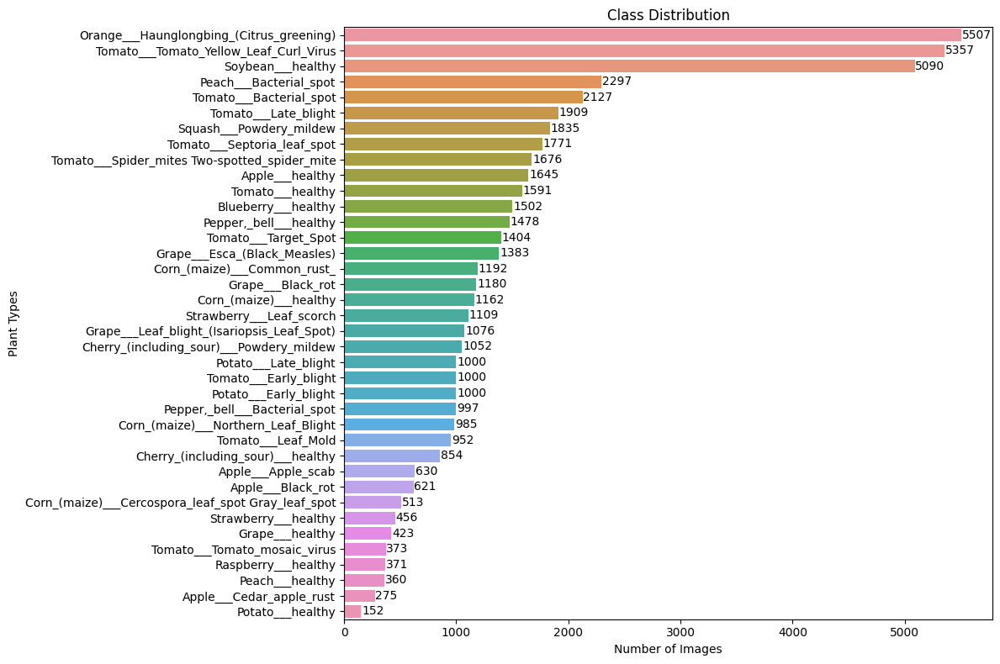

In [7]:
# Count the number of images in each class
class_counts = df['label'].value_counts()

# Visualize class distribution using a horizontal bar plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=class_counts.values, y=class_counts.index, orient='h')
plt.title('Class Distribution')
plt.xlabel('Number of Images')
plt.ylabel('Plant Types')
plt.tight_layout()  # Adjust the layout to prevent overlapping labels

# Add data labels to each bar
for i, v in enumerate(class_counts.values):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

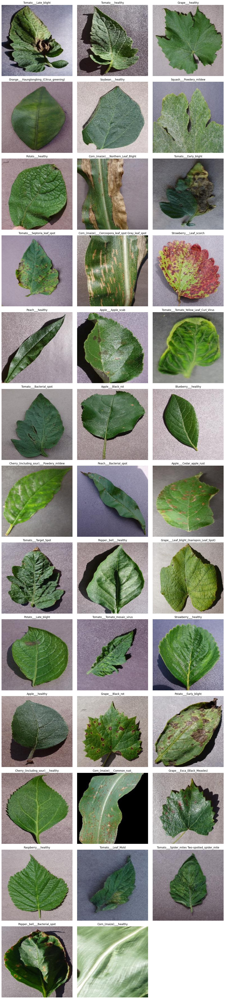

In [8]:
# Display sample images from each class
num_classes = len(df['label'].unique())
num_images_per_row = 3
num_rows = (num_classes + num_images_per_row - 1) // num_images_per_row

plt.figure(figsize=(15, 5 * num_rows))  # Adjust figure size based on the number of rows

for i, plant_class in enumerate(df['label'].unique()):
    plt.subplot(num_rows, num_images_per_row, i + 1)
    
    # Inside the loop for displaying sample images
    image_path = os.path.join(data_dir, df[df['label'] == plant_class]['image_path'].iloc[0])

    # Check if the image exists and can be loaded
    if os.path.exists(image_path):
        sample_image = cv2.imread(image_path)
        if sample_image is not None:
            plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
            plt.title(plant_class)
            plt.axis('off')
        else:
            print(f"Error: Unable to load image from path: {image_path}")
    else:
        print(f"Error: Image path does not exist: {image_path}")

plt.tight_layout()
plt.show()

In [9]:
class_labels_dict = {class_label: idx for idx, class_label in enumerate(np.unique(df['label']))}
df['label'] = df['label'].map(class_labels_dict)

In [10]:
# Split the data into training and test sets (80% training, 20% test)
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

In [11]:
train_df.shape, test_df.shape

((43444, 2), (10861, 2))

In [12]:
# Split the training data into training and validation sets (80% training, 20% validation)
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42)

In [13]:
train_df.shape, val_df.shape

((34755, 2), (8689, 2))

In [14]:
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)

In [15]:
print(train_df['label'].unique())


['35' '24' '8' '9' '5' '15' '4' '11' '33' '12' '19' '27' '32' '13' '26'
 '1' '16' '3' '21' '14' '28' '30' '6' '34' '29' '25' '31' '20' '0' '10'
 '37' '17' '18' '23' '36' '7' '2' '22']


In [16]:
batch_size = 40

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)
val_datagen = ImageDataGenerator(rescale=1./255)

val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='image_path',
    y_col='label',
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
# Step 4: Model Selection
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# num_classes = len(class_folders)
num_classes = len(class_labels_dict)


# Step 5: Model Building
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Step 6: Model Training
learning_rate = 0.001
model.compile(optimizer=Adam(learning_rate=learning_rate), loss='categorical_crossentropy', metrics=['accuracy'])

epochs = 10
history = model.fit(train_generator, epochs=epochs, validation_data=val_generator)

Found 34755 validated image filenames belonging to 38 classes.
Found 8689 validated image filenames belonging to 38 classes.
Found 10861 validated image filenames belonging to 38 classes.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/869 ━━━━━━━━━━━━━━━━━━━━ 14:45:14 61s/step - accuracy: 0.0500 - loss: 3.8920

I0000 00:00:1710230918.481950      80 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


869/869 ━━━━━━━━━━━━━━━━━━━━ 676s 708ms/step - accuracy: 0.7987 - loss: 0.7321 - val_accuracy: 0.1051 - val_loss: 15.3623
Epoch 2/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 421s 481ms/step - accuracy: 0.9398 - loss: 0.1924 - val_accuracy: 0.3160 - val_loss: 9.1218
Epoch 3/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 400s 457ms/step - accuracy: 0.9537 - loss: 0.1528 - val_accuracy: 0.2576 - val_loss: 7.1944
Epoch 4/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 397s 453ms/step - accuracy: 0.9639 - loss: 0.1127 - val_accuracy: 0.6516 - val_loss: 2.6975
Epoch 5/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 397s 453ms/step - accuracy: 0.9636 - loss: 0.1193 - val_accuracy: 0.4335 - val_loss: 6.0835
Epoch 6/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 400s 457ms/step - accuracy: 0.9664 - loss: 0.1126 - val_accuracy: 0.4755 - val_loss: 3.8187
Epoch 7/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 400s 457ms/step - accuracy: 0.9734 - loss: 0.0864 - val_accuracy: 0.5567 - val_loss: 3.3689
Epoch 8/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 438s 452ms/step - accuracy: 0.9727 - loss: 0.0

In [17]:
# Check the keys available in the model history
print(model.history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [18]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 ━━━━━━━━━━━━━━━━━━━━ 76s 281ms/step - accuracy: 0.9064 - loss: 0.4387
Test Loss: 0.442592591047287, Test Accuracy: 0.9083877801895142


In [19]:
# Make predictions on the test set
test_predictions = model.predict(test_generator)
test_predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels for the test set
test_true_labels = test_generator.classes

# Create a DataFrame for analysis
error_df = pd.DataFrame({'True Label': test_true_labels, 'Predicted Label': test_predicted_labels})

# Misclassified images
misclassified_images = error_df[error_df['True Label'] != error_df['Predicted Label']]

272/272 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step


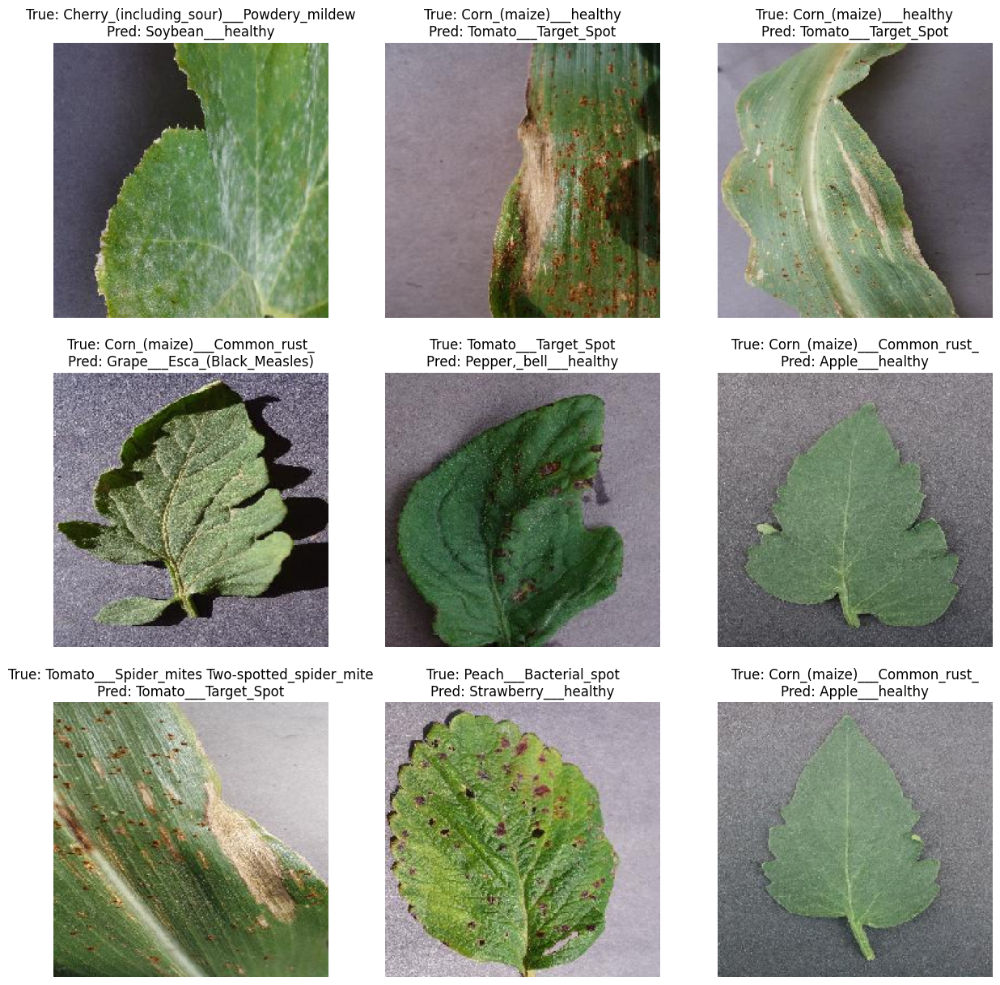

In [20]:
# Visualization of misclassified images
plt.figure(figsize=(15, 15))
for i, row in enumerate(misclassified_images.head(9).itertuples()):
    img_path = test_df.iloc[row.Index]['image_path']
    img = keras_image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    true_label = class_folders[row._1]  # Use 'True Label' as defined in error_df
    pred_label = class_folders[row._2]  # Use 'Predicted Label' as defined in error_df
    plt.title(f'True: {true_label}\nPred: {pred_label}')
    plt.axis('off')
plt.show()

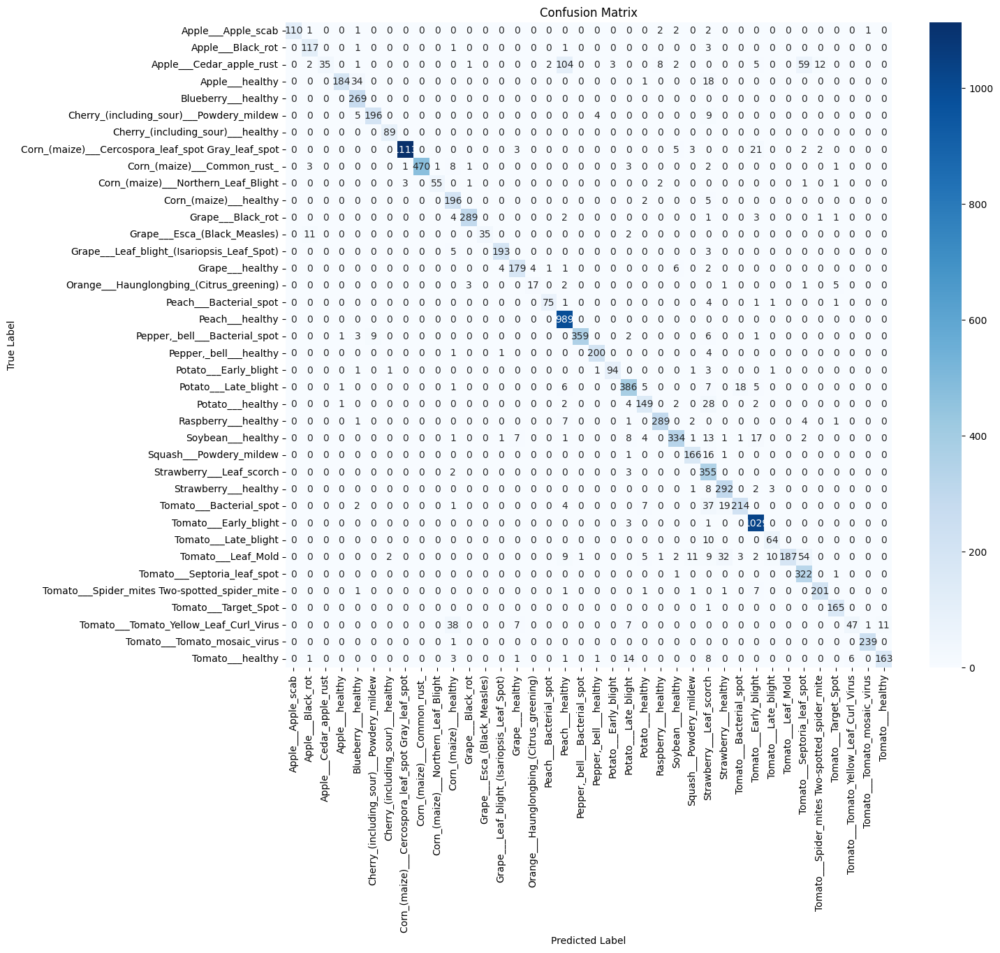

In [21]:
# Confusion Matrix and Classification Report
plt.figure(figsize=(14, 12))
conf_matrix = confusion_matrix(test_true_labels, test_predicted_labels)
class_names = list(class_labels_dict.keys())
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [22]:
print(classification_report(test_true_labels, test_predicted_labels, target_names=class_names))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.92      0.96       119
                                 Apple___Black_rot       0.87      0.95      0.91       123
                          Apple___Cedar_apple_rust       1.00      0.15      0.26       234
                                   Apple___healthy       0.98      0.78      0.87       237
                               Blueberry___healthy       0.84      1.00      0.91       269
          Cherry_(including_sour)___Powdery_mildew       0.96      0.92      0.94       214
                 Cherry_(including_sour)___healthy       0.97      1.00      0.98        89
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      0.97      0.98      1149
                       Corn_(maize)___Common_rust_       1.00      0.96      0.98       490
               Corn_(maize)___Northern_Leaf_Blight       0.98      0.87      0.

In [23]:
# Unfreeze more layers in the MobileNetV2 model
n = 40
for layer in model.layers[:-n]:
    layer.trainable = True

# Adjust the learning rate for fine-tuning
learning_rate_finetune = 0.00001

# Compile the model with the updated learning rate
model.compile(optimizer=Adam(learning_rate=learning_rate_finetune), loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning
epochs_finetune = 10
history_finetune = model.fit(train_generator, epochs=epochs_finetune, validation_data=val_generator)

Epoch 1/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 470s 489ms/step - accuracy: 0.9815 - loss: 0.0592 - val_accuracy: 0.9884 - val_loss: 0.0380
Epoch 2/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 398s 455ms/step - accuracy: 0.9900 - loss: 0.0319 - val_accuracy: 0.9914 - val_loss: 0.0260
Epoch 3/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 400s 457ms/step - accuracy: 0.9917 - loss: 0.0254 - val_accuracy: 0.9927 - val_loss: 0.0241
Epoch 4/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 402s 459ms/step - accuracy: 0.9935 - loss: 0.0209 - val_accuracy: 0.9931 - val_loss: 0.0218
Epoch 5/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 407s 465ms/step - accuracy: 0.9942 - loss: 0.0179 - val_accuracy: 0.9930 - val_loss: 0.0214
Epoch 6/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 408s 465ms/step - accuracy: 0.9936 - loss: 0.0182 - val_accuracy: 0.9939 - val_loss: 0.0196
Epoch 7/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 406s 464ms/step - accuracy: 0.9952 - loss: 0.0145 - val_accuracy: 0.9942 - val_loss: 0.0190
Epoch 8/10
869/869 ━━━━━━━━━━━━━━━━━━━━ 403s 460ms/step - accuracy: 0.9945 -

In [24]:
# Evaluate the Model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

272/272 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - accuracy: 0.9942 - loss: 0.0169
Test Loss: 0.016891971230506897, Test Accuracy: 0.9946597814559937


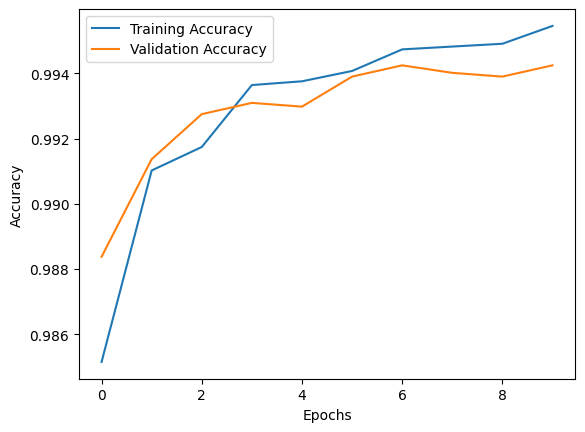

In [25]:
# Plot training and validation accuracy
plt.plot(history_finetune.history['accuracy'], label='Training Accuracy')
plt.plot(history_finetune.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

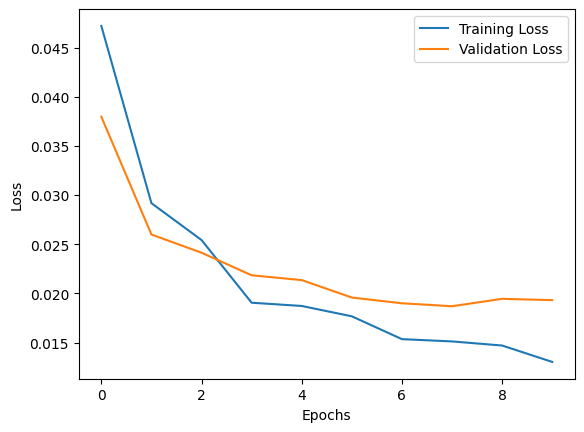

In [26]:
# Plot training and validation loss
plt.plot(history_finetune.history['loss'], label='Training Loss')
plt.plot(history_finetune.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()